# Import data

In [2]:
import os

HOME = os.path.expanduser('~')
PROJECT_DIR = os.path.join(HOME, 'OneDrive', 'Desktop', 'all', 'Masterclass-project', 'Stock-data')
os.chdir(PROJECT_DIR)
print(os.getcwd())

C:\Users\shalu\OneDrive\Desktop\all\Masterclass-project\Stock-data


In [3]:
os.listdir()

['Company_Data_Largecap.csv',
 'Company_Data_Midcap.csv',
 'Company_Data_Smallcap.csv']

In [4]:
# import pandas
import pandas as pd

#  read Company_Data_Largecap.csv
Largecap_df = pd.read_csv('Company_Data_Largecap.csv')
Smallcap_df =  pd.read_csv('Company_Data_Smallcap.csv')
Midcap_df   =    pd.read_csv('Company_Data_Midcap.csv')

# Exploratory Data Analysis

In [5]:
Largecap_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5883 entries, 0 to 5882
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                5883 non-null   object 
 1   Symbol              5883 non-null   object 
 2   Company Name        5883 non-null   object 
 3   Industry            5883 non-null   object 
 4   ISIN Code           5883 non-null   object 
 5   Bloomberg Symbol    5883 non-null   object 
 6   Series              5883 non-null   object 
 7   Prev Close          5883 non-null   float64
 8   Open                5883 non-null   float64
 9   High                5883 non-null   float64
 10  Low                 5883 non-null   float64
 11  Last                5883 non-null   float64
 12  Close               5883 non-null   float64
 13  VWAP                5883 non-null   float64
 14  Volume              5883 non-null   int64  
 15  Turnover            5883 non-null   float64
 16  Trades

In [6]:
#Change string to datetime
from datetime import date
from datetime import datetime
Largecap_df['Date'] = [datetime.strptime(x, '%d-%m-%Y') for x in Largecap_df['Date']]

In [7]:
Smallcap_df['Date'] = [datetime.strptime(x, '%d-%m-%Y') for x in Smallcap_df['Date']]
Midcap_df['Date'] = [datetime.strptime(x, '%d-%m-%Y') for x in Midcap_df['Date']]

In [8]:
import matplotlib.pyplot as plt
import numpy as np

In [8]:
Largecap_df.head()

,Date,Symbol,Company Name,Industry,ISIN Code,Bloomberg Symbol,Series,Prev Close,Open,High,...,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble,MA89,Signal
0,2021-01-01,ADANIGREEN,Adani Green Energy Ltd.,POWER,INE364U01010,ADANIGR IN Equity,EQ,1052.60,1079.9,1079.9,...,1064.45,1065.95,1065.26,297560,3.170000e+13,11137,141749,0.4764,1675.902809,0
1,2021-01-04,ADANIGREEN,Adani Green Energy Ltd.,POWER,INE364U01010,ADANIGR IN Equity,EQ,1065.95,1088.4,1090.0,...,1080.10,1082.25,1079.06,360776,3.890000e+13,24807,202194,0.5604,1670.670787,0
2,2021-01-05,ADANIGREEN,Adani Green Energy Ltd.,POWER,INE364U01010,ADANIGR IN Equity,EQ,1082.25,1070.2,1106.9,...,1092.10,1096.45,1086.98,526896,5.730000e+13,23766,274771,0.5215,1665.689888,0
3,2021-01-06,ADANIGREEN,Adani Green Energy Ltd.,POWER,INE364U01010,ADANIGR IN Equity,EQ,1096.45,1100.0,1111.0,...,1107.70,1107.25,1102.57,427847,4.720000e+13,22661,220893,0.5163,1660.665169,0
4,2021-01-07,ADANIGREEN,Adani Green Energy Ltd.,POWER,INE364U01010,ADANIGR IN Equity,EQ,1107.25,1113.7,1114.0,...,1051.90,1063.10,1091.78,1285732,1.400000e+14,35651,912309,0.7096,1654.973034,0


# Change in stock price of each stock each day

array([[<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>]],
      dtype=object)

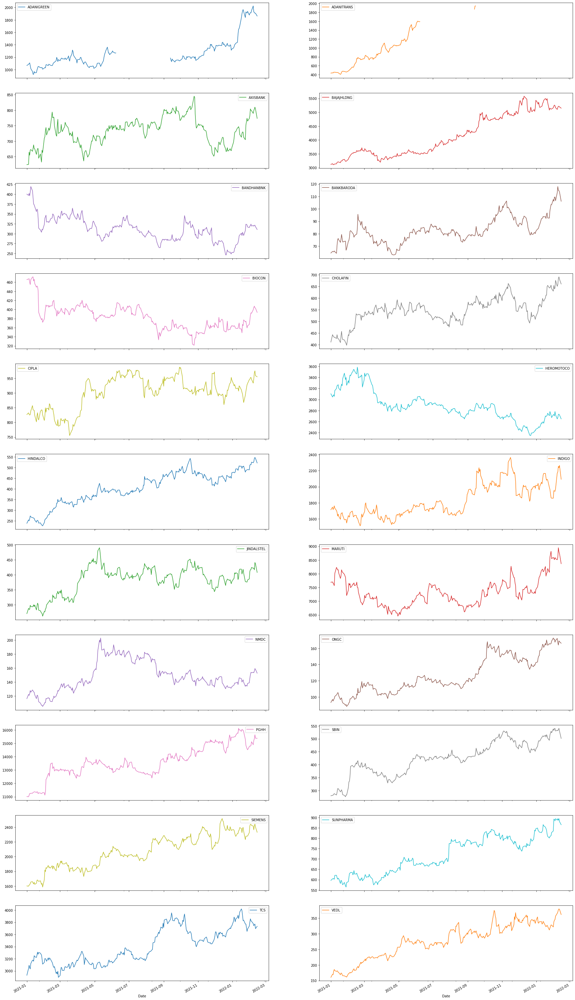

In [9]:

#Plot graph of each company closing price each day in a year
pd.pivot_table(Largecap_df.reset_index(),
               index='Date', columns='Symbol', values='Close'
              ).plot(subplots=True, layout=(11,2), figsize=(30,60))

In [10]:
Largecap_group=pd.pivot_table(Largecap_df.reset_index(),
               index='Date', columns='Symbol', values='Close'
              )

In [11]:
#Delete columns which have null>(no.of rows), Means drop columns whose last date's Closing value<89Moving Avergae
Largecap_group.drop(Largecap_group.columns[Largecap_group.apply(lambda col: col.isnull().sum() > 0)], axis=1, inplace=True)

array([[<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>]],
      dtype=object)

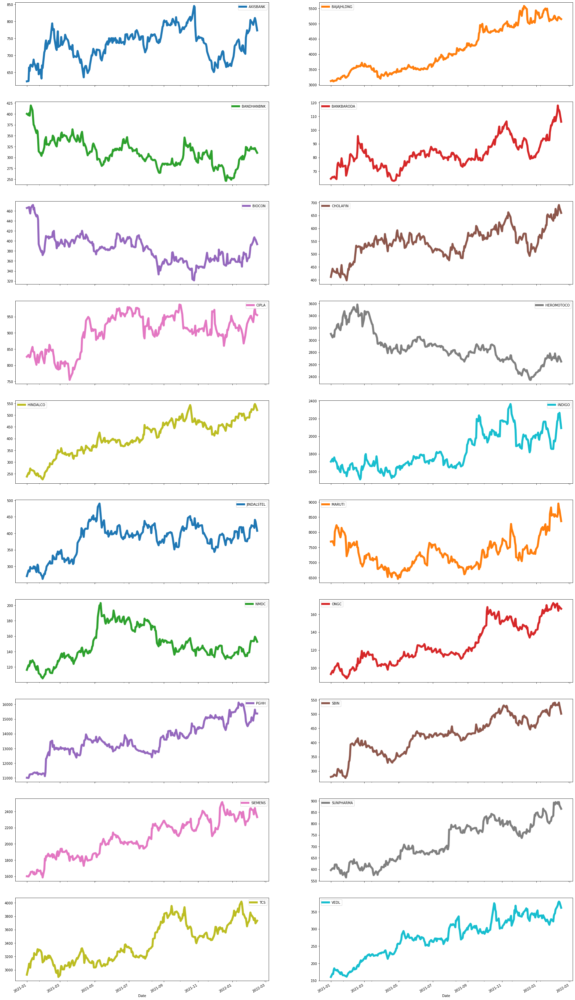

In [12]:
Largecap_group.plot(subplots=True,layout=(10,2),linewidth=6, figsize=(30,60))


# Now let's plot the total volume of stock being traded each day

array([[<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>]],
      dtype=object)

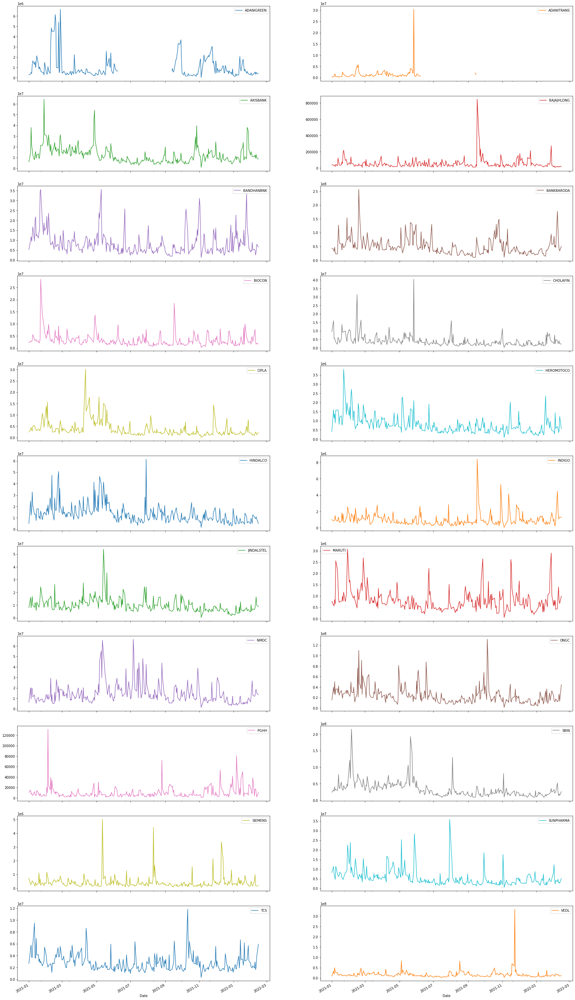

In [13]:
#Plot graph of each company closing price each day in a year
pd.pivot_table(Largecap_df.reset_index(),
               index='Date', columns='Symbol', values='Volume'
              ).plot(subplots=True, layout=(11,2), figsize=(30,60))

In [14]:
Largecap_volume=pd.pivot_table(Largecap_df.reset_index(),
               index='Date', columns='Symbol', values='Volume'
              )

In [15]:
#Delete columns which have null>(no.of rows), Means drop columns whose last date's Closing value<89Moving Avergae
Largecap_volume.drop(Largecap_volume.columns[Largecap_volume.apply(lambda col: col.isnull().sum() > 0)], axis=1, inplace=True)

array([[<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
       [<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>]],
      dtype=object)

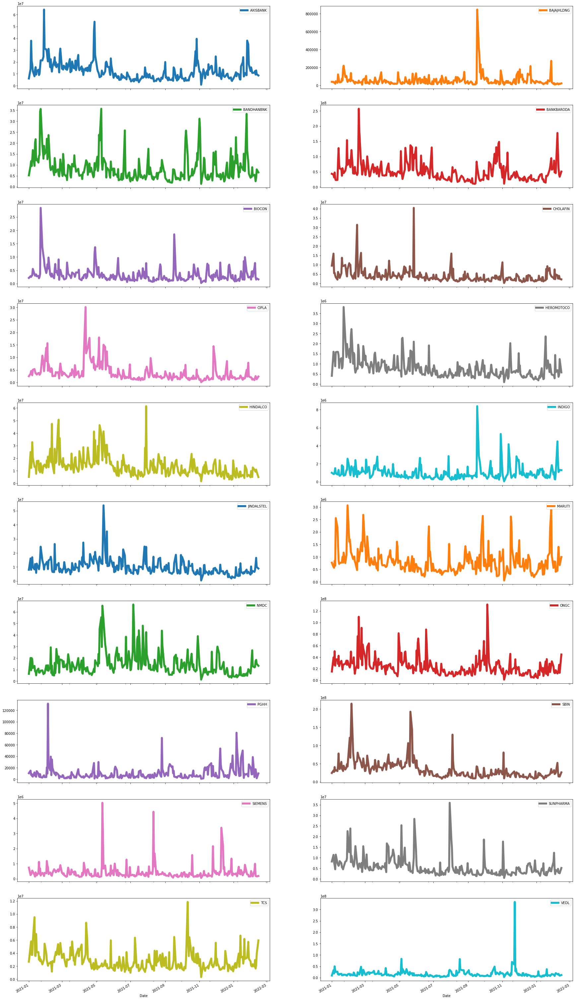

In [16]:
Largecap_volume.plot(subplots=True,layout=(10,2),linewidth=6, figsize=(30,60))

# Analyze moving average of various stocks

In [17]:

# Converting column names to list
Largecap_list = Largecap_group.columns.tolist()

In [18]:

Largecap_df = Largecap_df.astype({"Close": int})

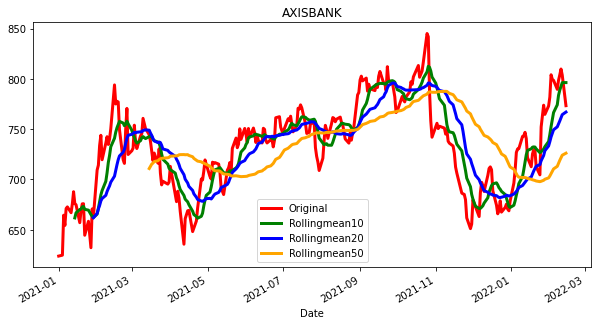

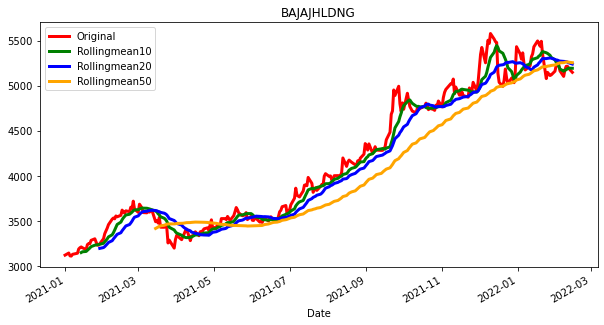

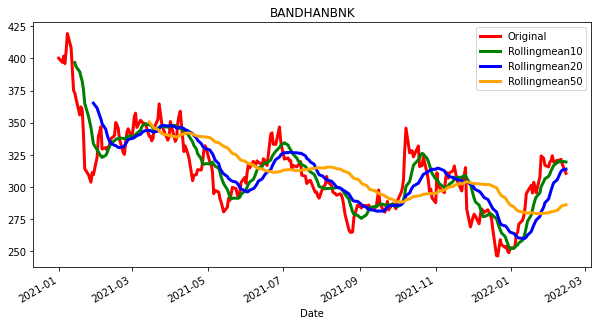

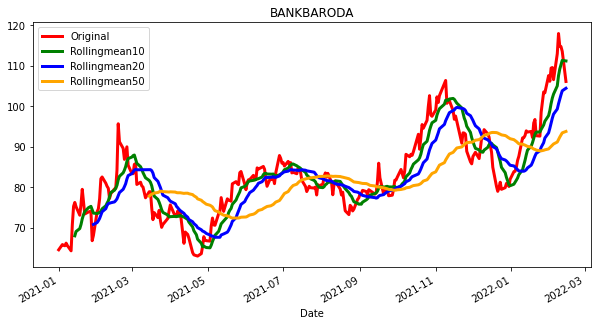

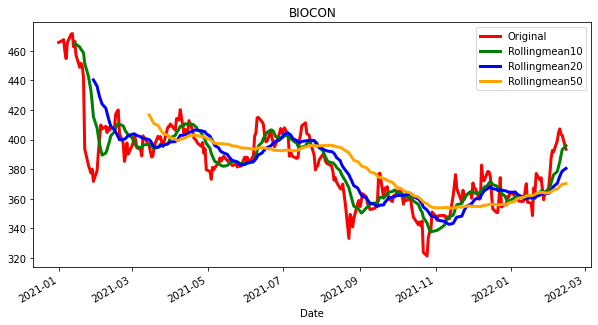

...

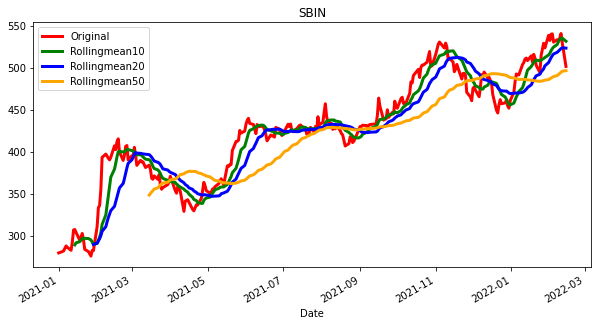

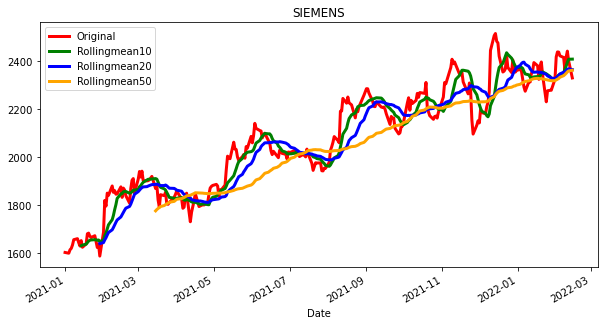

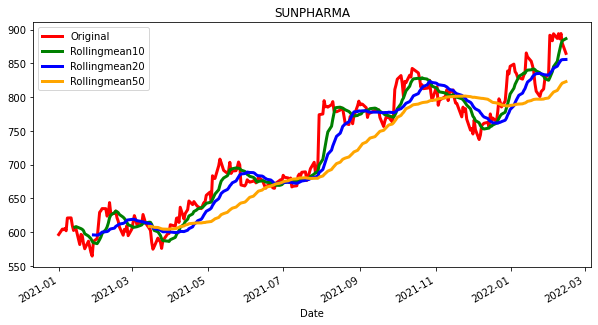

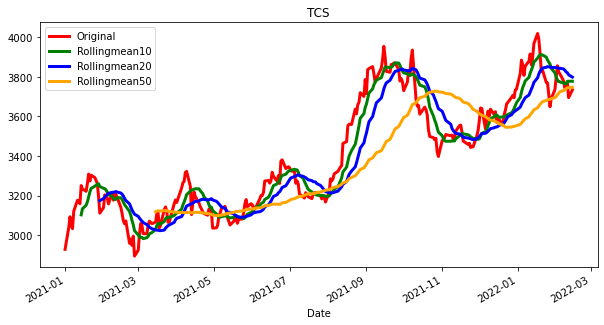

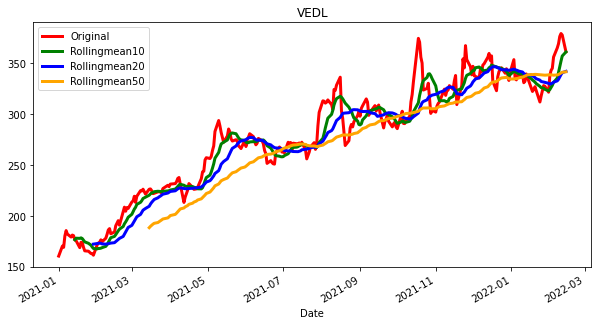

In [19]:
#Moving average 
for i in Largecap_list:
        rollmean10=Largecap_group[i].rolling(window=10).mean()
        rollmean20=Largecap_group[i].rolling(window=20).mean()
        rollmean50=Largecap_group[i].rolling(window=50).mean()
        original=Largecap_group[i].plot(linewidth=3,figsize=(10,5), color='red', label='Original')
        Mean10=rollmean10.plot(linewidth=3, figsize=(10,5), color='green', label='Rollingmean10')
        Mean20=rollmean20.plot(linewidth=3, figsize=(10,5), color='blue', label='Rollingmean20')
        Mean50=rollmean50.plot(linewidth=3, figsize=(10,5), color='orange', label='Rollingmean50')
        plt.legend()
        plt.title(i)
        plt.show()

# Daily return of stock on average


In [20]:
# Calculate returns
returns = Largecap_group.pct_change() # simple linear returns
log_rets = np.log(1+returns)

In [21]:
log_rets 

Symbol,AXISBANK,BAJAJHLDNG,BANDHANBNK,BANKBARODA,BIOCON,CHOLAFIN,CIPLA,HEROMOTOCO,HINDALCO,INDIGO,JINDALSTEL,MARUTI,NMDC,ONGC,PGHH,SBIN,SIEMENS,SUNPHARMA,TCS,VEDL
Date,,,,,,,,,,,,,,,,,,,,
2021-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-04,0.001442,0.007490,-0.008028,0.019955,0.002680,0.074690,0.006812,-0.019133,0.064774,0.018188,0.062941,0.001429,0.050691,0.039448,-0.001290,0.005888,-0.001938,0.013576,0.037272,0.059597
2021-01-05,0.061688,-0.010154,0.012143,-0.003044,0.001391,-0.013629,-0.006026,0.007642,-0.015854,-0.017459,-0.010658,-0.006101,-0.011917,-0.020845,0.009839,0.002488,0.008906,-0.001573,0.017465,-0.007369
2021-01-06,-0.015470,-0.000675,-0.014665,-0.001526,-0.017037,-0.005504,-0.002966,0.005316,0.034361,0.010298,-0.001582,-0.003513,0.018838,0.020845,0.011596,0.011644,0.003590,0.003061,-0.013508,0.064723
2021-01-07,0.025429,0.006189,0.024446,0.009875,-0.010825,-0.008081,0.002119,-0.009220,0.052084,0.016345,0.047415,-0.008233,0.037425,0.009751,-0.000641,0.009254,0.008766,-0.005633,-0.006147,0.028433
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-08,0.011271,0.013800,-0.005001,0.043316,0.013186,0.011319,0.015681,0.008985,0.008005,0.005744,0.001778,0.010262,-0.003579,-0.030381,0.021342,-0.003569,-0.021823,0.007916,-0.009452,0.011160
2022-02-09,0.006615,0.007760,0.006403,-0.026634,0.006528,0.037977,0.021083,0.021072,0.028998,0.032101,-0.013830,0.039894,0.014882,-0.018133,0.007849,0.007313,0.022486,-0.008593,0.004558,0.019301
2022-02-10,0.007375,0.000364,0.000778,-0.001307,-0.008755,0.011356,0.006998,0.001922,0.009086,-0.007594,0.056932,-0.016221,0.022858,0.030929,0.019702,0.009853,0.010289,0.008817,0.002603,0.007538


In [22]:
log_rets.columns

Index(['AXISBANK', 'BAJAJHLDNG', 'BANDHANBNK', 'BANKBARODA', 'BIOCON',
       'CHOLAFIN', 'CIPLA', 'HEROMOTOCO', 'HINDALCO', 'INDIGO', 'JINDALSTEL',
       'MARUTI', 'NMDC', 'ONGC', 'PGHH', 'SBIN', 'SIEMENS', 'SUNPHARMA', 'TCS',
       'VEDL'],
      dtype='object', name='Symbol')

# Daily return

numpy.ndarray

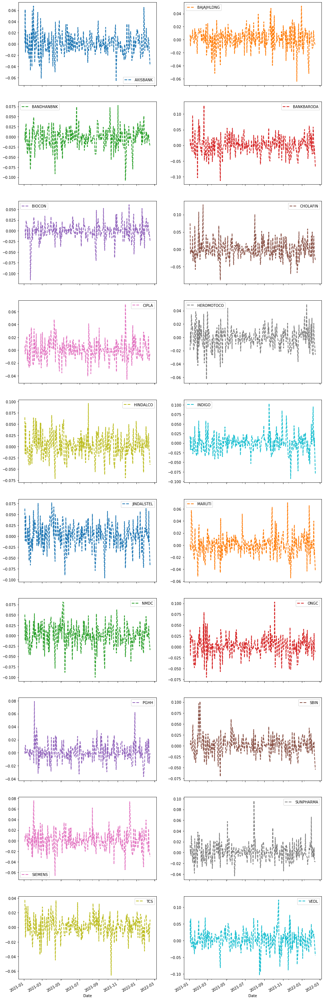

In [37]:
axes = log_rets.plot.line(linewidth=2, figsize=(15,55), subplots=True, layout=(10,2))
type(axes)

# Overall look at average daily return

numpy.ndarray

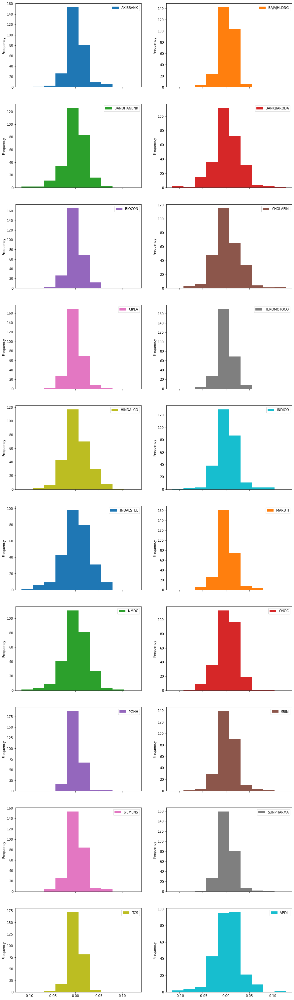

In [39]:
axes = log_rets.plot.hist(figsize=(15,55), subplots=True, layout=(10,2))
type(axes)

# Correlation between different stocks closing prices?

# Now we can compare the daily percentage return of two stocks to check how correlated. First let's see a stock compared to itself.

In [41]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


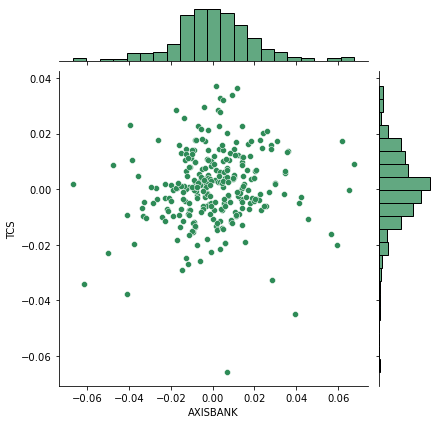

In [46]:
# Comparing Google to itself should show a perfectly linear relationship
import seaborn as sns
sns.jointplot(x='AXISBANK', y='TCS', data=log_rets, kind='scatter', color='seagreen')

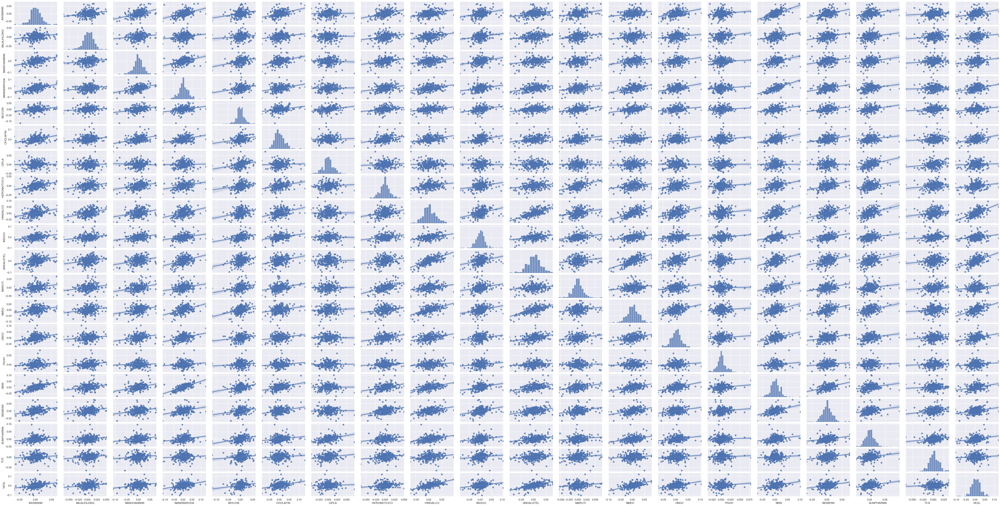

In [55]:
#Pairplot for automatic visualisation of all columns 
cor=sns.pairplot( log_rets, kind='reg')
cor.fig.set_figheight(30)
cor.fig.set_figwidth(60)

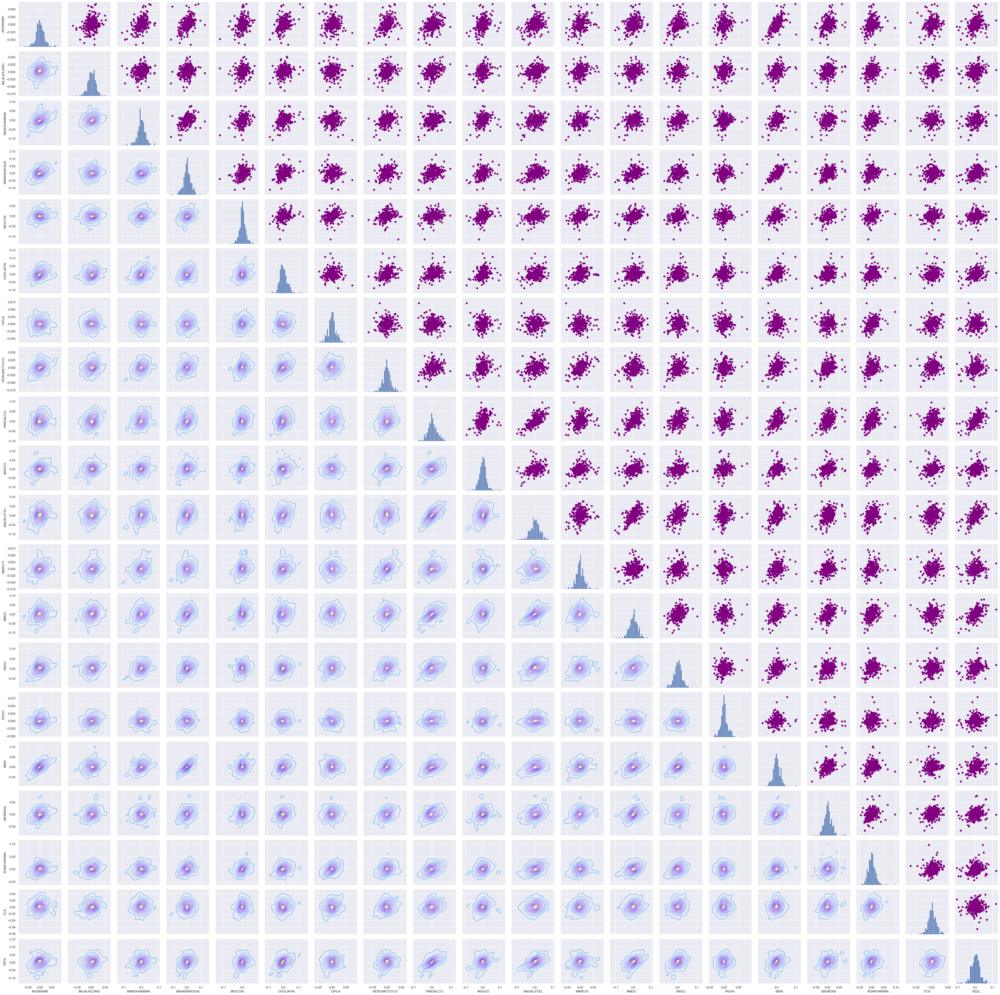

In [56]:
# Set up our figure by naming it returns_fig, call PairPLot on the DataFrame
return_fig = sns.PairGrid(log_rets.dropna())

# Using map_upper we can specify what the upper triangle will look like.
return_fig.map_upper(plt.scatter, color='purple')

# We can also define the lower triangle in the figure, inclufing the plot type (kde) 
# or the color map (BluePurple)
return_fig.map_lower(sns.kdeplot, cmap='cool_d')

# Finally we'll define the diagonal as a series of histogram plots of the daily return
return_fig.map_diag(plt.hist, bins=30)

<AxesSubplot:xlabel='Symbol', ylabel='Symbol'>

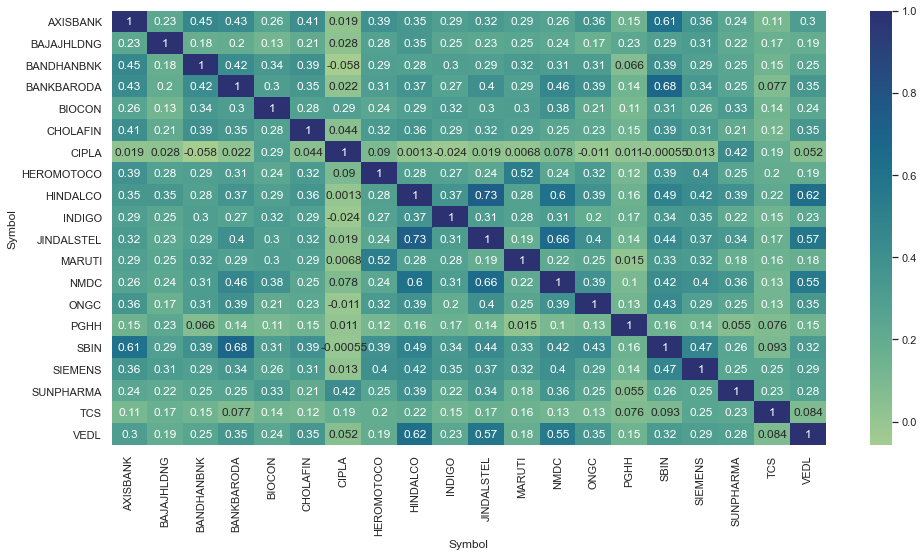

In [68]:
plt.figure(figsize = (16,8))
sns.heatmap(log_rets.corr(), annot=True, cmap='crest')

<AxesSubplot:xlabel='Symbol', ylabel='Symbol'>

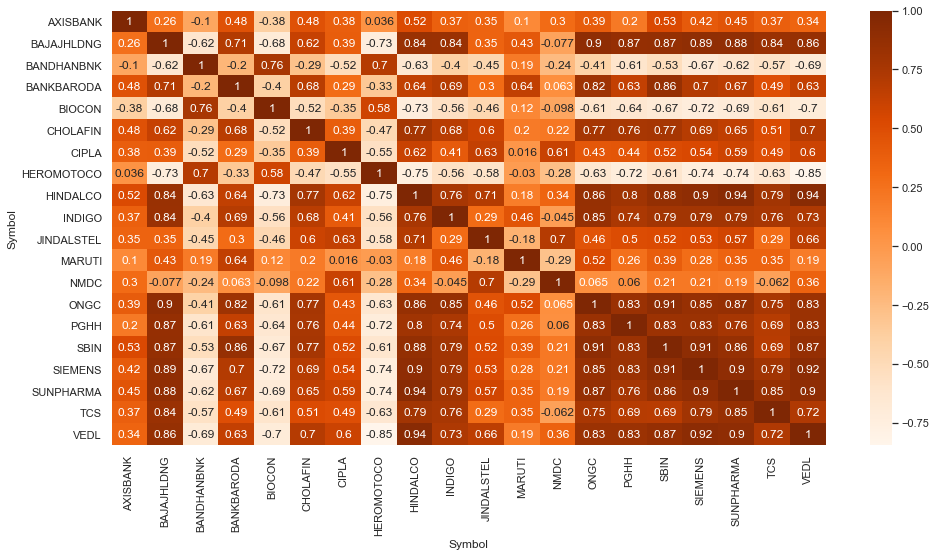

In [77]:
plt.figure(figsize = (16,8))
sns.heatmap(Largecap_group.corr(), annot=True, cmap='Oranges')

# Risk by investing in a particular stock

In [ ]:
#There are many ways we can quantify risk, one of the most basic ways using the information we've gathered on 
#daily percentage returns is by comparing the expected return with the standard deviation of the daily returns.

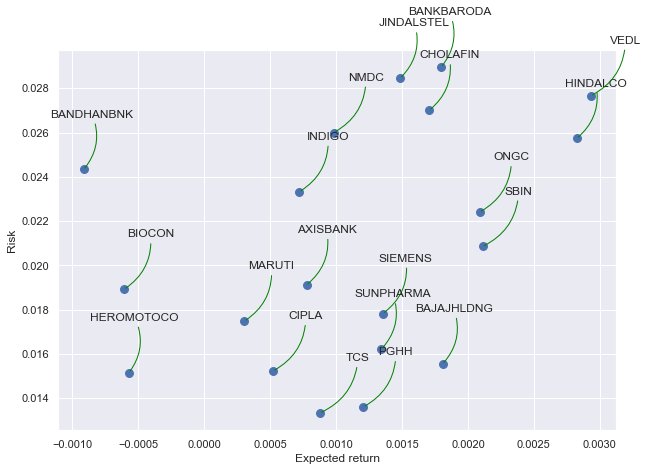

In [82]:
# Let's start by defining a new DataFrame as a clenaed version of the oriignal tech_rets DataFrame
rets = log_rets.dropna()

area = np.pi * 20

plt.figure(figsize=(10, 7))
plt.scatter(rets.mean(), rets.std(), s=area)
plt.xlabel('Expected return')
plt.ylabel('Risk')

for label, x, y in zip(rets.columns, rets.mean(), rets.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                 arrowprops=dict(arrowstyle='-', color='green', connectionstyle='arc3,rad=-0.3'))